# Monte Carlo Simulation on Stock Price Forecasting Using Python

In [50]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter('ignore')

In [51]:
import numpy as np
import pandas as pd

#Plotting and Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

from statsmodels.tsa.stattools import acf, pacf, q_stat, adfuller, grangercausalitytests
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [52]:
import platform
print(f"Python version: {platform.python_version()}")
print(f"numpy version: {np.__version__}")
print(f"panda version: {pd.__version__}")
print(f"seaborn version: {sns.__version__}")
import matplotlib
print(f"matplotlib version: {matplotlib.__version__}")
import statsmodels
print(f"statsmodel version: {statsmodels.__version__}")
import scipy
print(f"scipy version: {scipy.__version__}")

Python version: 3.10.14
numpy version: 1.26.4
panda version: 2.2.1
seaborn version: 0.13.2
matplotlib version: 3.7.5
statsmodel version: 0.14.1
scipy version: 1.14.1


## Helper Function

In [53]:
# Helper Function to fetch historical stock data
import yfinance as yf
def get_stock_data(ticker, start_date, end_date):
    try:
        # https://medium.com/nerd-for-tech/all-you-need-to-know-about-yfinance-yahoo-finance-library-fa4c6e48f08e
        #data = yf.Ticker(ticker).history(start=start_date, end=end_date)  
        data = yf.download(ticker, start=start_date, end=end_date)
        return data
    except Exception as e:
        return f"Error fetching data: {e}"

In [54]:
# code from https://goldinlocks.github.io/Multivariate-time-series-models/

from scipy.stats import probplot, moment
# Hurst Exponent
def hurst(ts):
    lags = range(2, 100)
    tau = [np.sqrt(np.std(np.subtract(ts[lag:], ts[:-lag]))) for lag in lags]
    poly = np.polyfit(np.log(lags), np.log(tau), 1)
    return poly[0]*2.0
    
# Correlogram Plot
def plot_correlogram(x, lags=None, title=None):    
    lags = min(10, int(len(x)/5)) if lags is None else lags
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
    x.plot(ax=axes[0][0])
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    stats = f'Q-Stat: {np.max(q_p):>8.2f}\nADF: {adfuller(x)[1]:>11.2f} \nHurst: {round(hurst(x.values),2)}'
    axes[0][0].text(x=.02, y=.85, s=stats, transform=axes[0][0].transAxes)
    probplot(x, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(x, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=x, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(x, lags=lags, zero=False, ax=axes[1][1])
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    fig.suptitle(title, fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=.9)

## Step 1: Gather Historical Data

In [55]:
ticker_symbol = "PREIX"  #  T. Rowe Price Equity Index 500 Fund
start_date = "2000-01-01"
end_date = "2024-10-01"
stock_data = get_stock_data(ticker_symbol, start_date, end_date)
stock_data.asfreq('B').index  # set index frequency to business daliy
stock_data.info()

[*********************100%%**********************]  1 of 1 completed

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6225 entries, 2000-01-03 to 2024-09-30
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       6225 non-null   float64
 1   High       6225 non-null   float64
 2   Low        6225 non-null   float64
 3   Close      6225 non-null   float64
 4   Adj Close  6225 non-null   float64
 5   Volume     6225 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 469.5 KB


In [56]:
stock_data.isnull().sum(axis=0) # check any NA

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [57]:
stock_data.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2024-09-24,151.179993,151.179993,151.179993,151.179993,151.179993,0
2024-09-25,150.899994,150.899994,150.899994,150.899994,150.899994,0
2024-09-26,151.100006,151.100006,151.100006,151.100006,151.100006,0
2024-09-27,150.910004,150.910004,150.910004,150.910004,150.910004,0
2024-09-30,151.559998,151.559998,151.559998,151.559998,151.559998,0


In [58]:
import plotly.express as px

fig = px.line(stock_data, x=stock_data.index, y='Close', title=f'The Stock Close Price of {ticker_symbol}',
              labels={'Close': 'Close Price $'},
              template='plotly', width=1000, height=600)
fig.update_traces(line_color='lawngreen')
fig.update_layout(title_font_color='blue', title_font_size=20)
fig.show()

In [59]:
# Augmented Dickey–Fuller test for stationarity
result = adfuller(stock_data['Close'],regression ='ctt')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
if result[1]  > 0.05 :
    print('Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.')
elif result[1] <= 0.05 :
    print('Reject the null hypothesis (H0), the data does not have a unit root and is stationary.')

ADF Statistic: -3.051038
p-value: 0.271434
Critical Values:
	1%: -4.373
	5%: -3.833
	10%: -3.554
Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.


In [60]:
# calculate the daily returns of the stock investment based on the percentage of the close price changes.
# The pct_change method will automatically calculate the percentage changes of the current day’s close price compared with the previous day. 
stock_data['Daily_Return'] = stock_data['Close'].pct_change()
stock_data.dropna(inplace=True)

In [61]:
import plotly.express as px

fig = px.line(stock_data, x=stock_data.index, y='Daily_Return', title=f'{ticker_symbol} - Daily Returns Over Time',
              labels={'Daily_Return': 'Daily Returns'},
              template='plotly_white')
fig.update_layout(showlegend=False)
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.show()


### Daily return is Stationary - 

#### A time series is stationary when its statistical properties, like its mean, variance, and autocorrelation structure, remain constant over time.

In [62]:
# 

result = adfuller(stock_data['Daily_Return'],regression ='ctt')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
if result[1]  > 0.05 :
    print('Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.')
elif result[1] <= 0.05 :
    print('Reject the null hypothesis (H0), the data does not have a unit root and is stationary.')

ADF Statistic: -15.156219
p-value: 0.000000
Critical Values:
	1%: -4.373
	5%: -3.833
	10%: -3.554
Reject the null hypothesis (H0), the data does not have a unit root and is stationary.


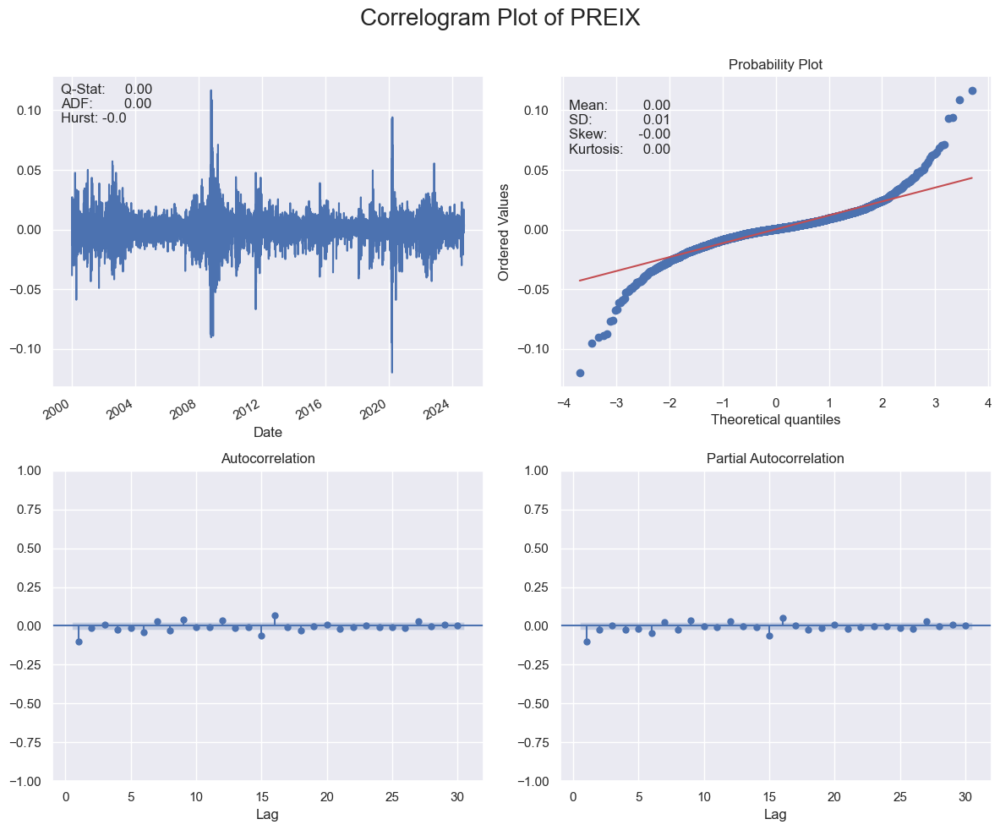

In [63]:
plot_correlogram(stock_data['Daily_Return'], lags=30, title=f'Correlogram Plot of {ticker_symbol}')

### A goodness of fit test is a statistical method that compares observed data to a predicted model to determine how well the model fits the data.

### The Anderson-Darling test - for normal distribution 

In [64]:
from scipy.stats import anderson

# Perform Anderson-Darling test
result = anderson(stock_data['Daily_Return'], dist='norm')
print('Statistic: %.3f' % result.statistic)

for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    print('Significance Level: %.3f, Critical Value: %.3f' % (sl, cv))
    if result.statistic < cv:
        print('Sample looks normal (fail to reject H0)')
    else:
        print('Sample does not look normal (reject H0)')


Statistic: 115.912
Significance Level: 15.000, Critical Value: 0.576
Sample does not look normal (reject H0)
Significance Level: 10.000, Critical Value: 0.656
Sample does not look normal (reject H0)
Significance Level: 5.000, Critical Value: 0.786
Sample does not look normal (reject H0)
Significance Level: 2.500, Critical Value: 0.917
Sample does not look normal (reject H0)
Significance Level: 1.000, Critical Value: 1.091
Sample does not look normal (reject H0)


### The Kolmogorov-Smirnov test - for Student's t-distribution.

In [66]:
from scipy.stats import kstest, t

# Fit the data using t-distribution
params = t.fit(stock_data['Daily_Return'])
d, p_value = kstest(stock_data['Daily_Return'], 't', args=params)
print(f"KS Statistic: {d}, P-Value: {p_value}")

if p_value > 0.05:
    print('Sample fits the t-distribution (fail to reject H0)')
else:
    print('Sample does not fit the t-distribution (reject H0)')


KS Statistic: 0.016994153994507558, P-Value: 0.05429605973725893
Sample fits the t-distribution (fail to reject H0)


## Step 2: Calculate Mean and Standard Deviation

### Fit Data with SciPy: Here, let’s fit a normal distribution to the daily returns.

Mean: 0.00029272365933547066, Standard Deviation: 0.012264100931022497


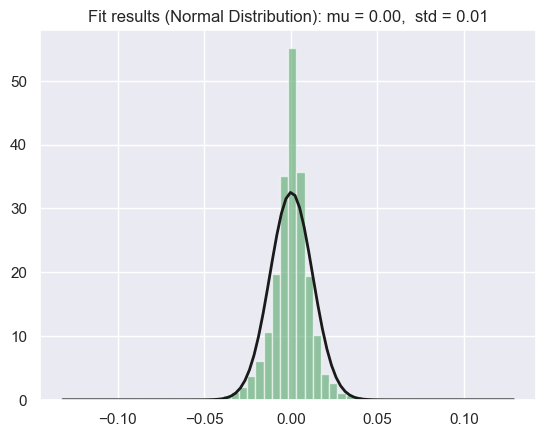

In [67]:
from scipy.stats import norm

# Fit a normal distribution to the daily return data
mu, std = norm.fit(stock_data['Daily_Return'])

# Print out the mean and standard deviation
print(f"Mean: {mu}, Standard Deviation: {std}")

# Plot the histogram of the daily returns
plt.hist(stock_data['Daily_Return'], bins=50, density=True, alpha=0.6, color='g')

# Plot the PDF
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)

plt.plot(x, p, 'k', linewidth=2)
title = f"Fit results (Normal Distribution): mu = {mu:.2f},  std = {std:.2f}"
plt.title(title)

plt.show()

# Save the figure
#plt.savefig('Normal Dist.jpg')

# Step 3: Simulate Future Returns
### Analyze the results: Visualize the distribution of outcomes

### The next day price is today’s price multiplying by (1+return %):

$$ \large P_{t+1} = P_t * (1 + Return\%) $$

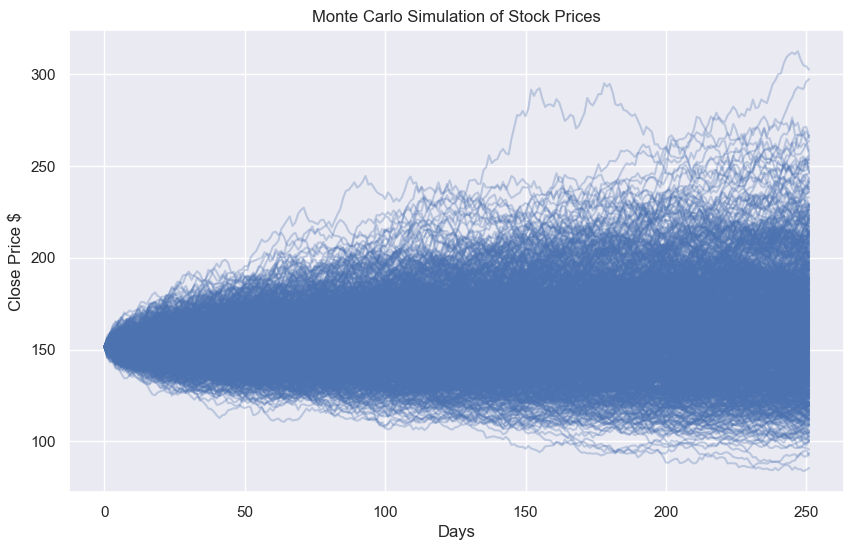

In [68]:
# Parameters
num_simulations = 1000  # Number of simulation paths
num_days = 252  # Number of trading days in a year

# Initialize a matrix to store the simulation results
simulations = np.zeros((num_simulations, num_days))

# Generate simulation paths
for i in range(num_simulations):
    simulations[i, 0] = stock_data['Close'].iloc[-1]  # Start with the last closing price
    for t in range(1, num_days):
        daily_return = np.random.normal(mu, std)
        simulations[i, t] = simulations[i, t-1] * (1 + daily_return)

# Plot the simulations
plt.figure(figsize=(10, 6))
plt.plot(simulations.T, color='b', alpha=0.3)
plt.title('Monte Carlo Simulation of Stock Prices')
plt.xlabel('Days')
plt.ylabel('Close Price $')
plt.show()


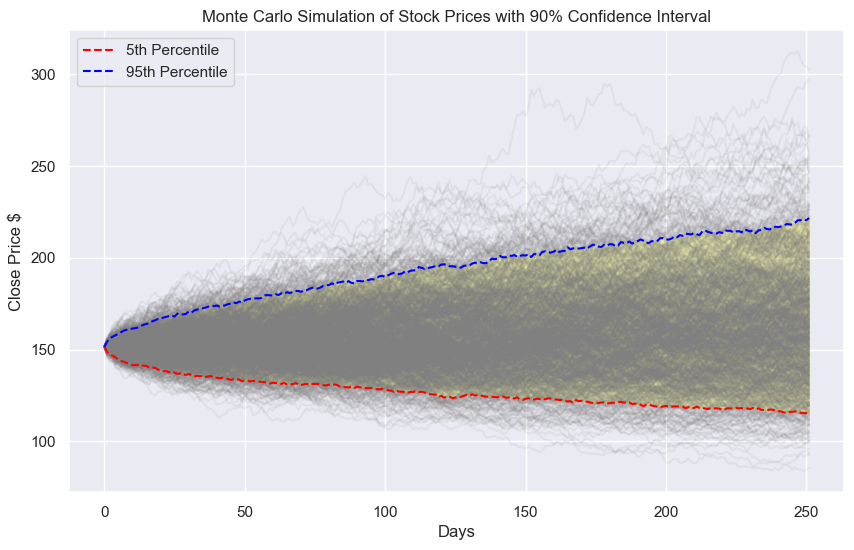

In [69]:
# Calculate the Quantiles

upper_bound = np.quantile(simulations,0.95, axis=0)
lower_bound = np.quantile(simulations,0.05, axis=0)


# Plot the simulations with quantile bounds
plt.figure(figsize=(10, 6))
plt.plot(simulations.T, color='gray', alpha=0.1)
plt.plot(lower_bound, color='red', linestyle='--', label='5th Percentile')
plt.plot(upper_bound, color='blue', linestyle='--', label='95th Percentile')
plt.fill_between(range(num_days), lower_bound, upper_bound, color='yellow', alpha=0.3)
plt.title('Monte Carlo Simulation of Stock Prices with 90% Confidence Interval')
plt.xlabel('Days')
plt.ylabel('Close Price $')
plt.legend()
plt.show()


## Fit the returns as a Student’s t-distribution
### You might find that the t-distribution provides a better fit for datasets with heavier tails, which often happens with financial returns.

Degrees of Freedom: 2.6606212055936953, Mean: 0.0006423654065788996, Standard Deviation: 0.007119559788511665


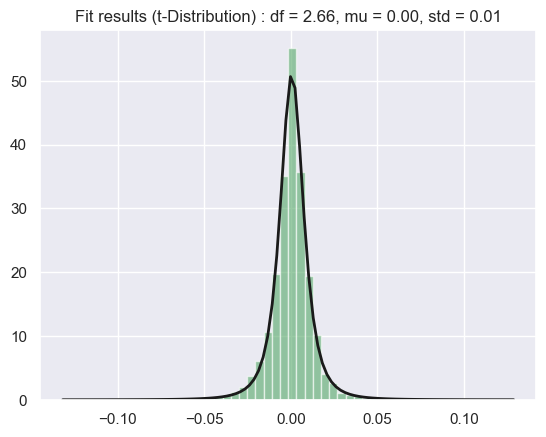

In [70]:
from scipy.stats import t

# Fit a t-distribution to the daily return data
params = t.fit(stock_data['Daily_Return'])

# Get the parameters
dfree, mu, std = params
print(f"Degrees of Freedom: {dfree}, Mean: {mu}, Standard Deviation: {std}")

# Plot the histogram and the PDF
plt.hist(stock_data['Daily_Return'], bins=50, density=True, alpha=0.6, color='g')

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = t.pdf(x, dfree, mu, std)

plt.plot(x, p, 'k', linewidth=2)
title = f"Fit results (t-Distribution) : df = {dfree:.2f}, mu = {mu:.2f}, std = {std:.2f}"
plt.title(title)

plt.show()

# Save the figure
#plt.savefig('t_dist.jpg')

### The next day price is today’s price multiplying by (1+return %):

$$ \large P_{t+1} = P_t * (1 + Return\%) $$

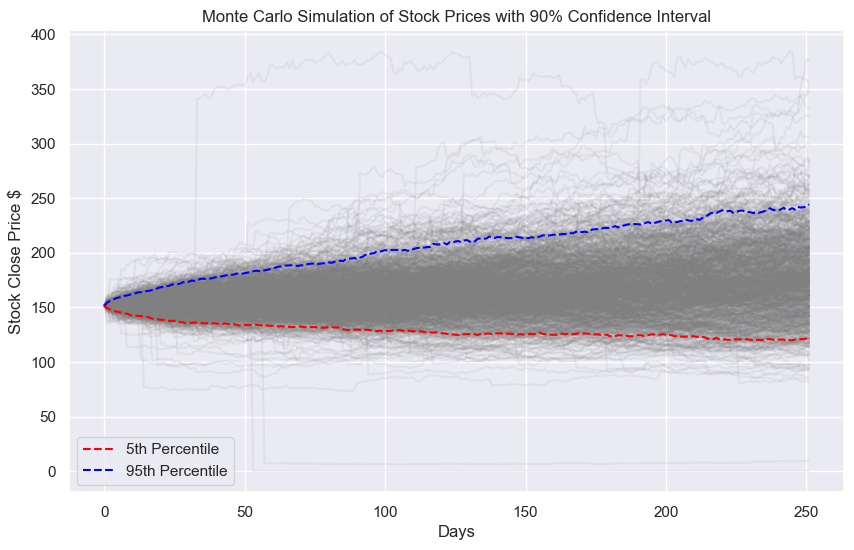

In [71]:
import scipy.stats as  stats
import matplotlib.pyplot as plt

# Fit a t-distribution to the daily return data
params = stats.t.fit(stock_data['Daily_Return'])
df_t, loc, scale = params[0], params[1], params[2]

# Number of simulations and forecast days
num_simulations = 1000
forecast_days = 252  # 1 year of trading days

# Generate random samples using t-distribution
simulated_returns = stats.t.rvs(df_t, loc=loc, scale=scale, size=(forecast_days, num_simulations))

# Starting stock price
start_price = stock_data['Close'].iloc[-1]

# Simulate stock price paths
price_paths = np.zeros_like(simulated_returns)
price_paths[0] = start_price

for t in range(1, forecast_days):
    price_paths[t] = np.maximum(price_paths[t - 1] * (1 + simulated_returns[t]), 0)

# Calculate the 5th and 95th percentiles of the stock prices
lower_bound = np.percentile(price_paths, 5, axis=1)
upper_bound = np.percentile(price_paths, 95, axis=1)

# Plot the results
plt.figure(figsize=(10,6))
plt.plot(price_paths, color='grey', alpha=0.1)
plt.plot(lower_bound, color='red', linestyle='dashed', label='5th Percentile')
plt.plot(upper_bound, color='blue', linestyle='dashed', label='95th Percentile')
plt.title('Monte Carlo Simulation of Stock Prices with 90% Confidence Interval')
plt.xlabel('Days')
plt.ylabel('Stock Close Price $')
plt.legend()
plt.show()

In [72]:
import scipy.stats as stats
import numpy as np
import plotly.graph_objects as go

# Fit a t-distribution to the daily return data
params = stats.t.fit(stock_data['Daily_Return'])
df_t, loc, scale = params[0], params[1], params[2]

# Number of simulations and forecast days
num_simulations = 1000
forecast_days = 252  # 1 year of trading days

# Generate random samples using t-distribution
simulated_returns = stats.t.rvs(df_t, loc=loc, scale=scale, size=(forecast_days, num_simulations))

# Starting stock price
start_price = stock_data['Close'].iloc[-1]

# Simulate stock price paths
price_paths = np.zeros_like(simulated_returns)
price_paths[0] = start_price

for t in range(1, forecast_days):
    price_paths[t] = np.maximum(price_paths[t - 1] * (1 + simulated_returns[t]), 0)

# Calculate the 5th and 95th percentiles of the stock prices
lower_bound = np.percentile(price_paths, 5, axis=1)
upper_bound = np.percentile(price_paths, 95, axis=1)

# Create a figure
fig = go.Figure()

# Add traces for each simulation
for i in range(num_simulations):
    fig.add_trace(go.Scatter(y=price_paths[:, i], mode='lines', line=dict(color='grey', width=1), showlegend=False))

# Add traces for the lower and upper bounds
fig.add_trace(go.Scatter(y=lower_bound, mode='lines', name='5th Percentile', line=dict(color='red', width=2, dash='dash')))
fig.add_trace(go.Scatter(y=upper_bound, mode='lines', name='95th Percentile', line=dict(color='blue', width=2, dash='dash')))

# Update layout
fig.update_layout(title='Monte Carlo Simulation of Stock Prices with 90% Confidence Interval',
                   xaxis_title='Days',
                   yaxis_title='Stock Close Price $', width=1000, height=600)

# Show the figure
fig.show()

# Save the figure as a JPG image
#fig.write_image("MonteCarloSim.jpg")